# A Simple NMF (Nonnegative Matrix Factorization) Application Example
## Decomposing the Introductions of: 
## Bruce Springsteen - Streets of Philadelphia and Guns n' Roses - Sweet Child O' Mine
### Renato Profeta - PhD Candidate - [TU Ilmenau](https://www.tu-ilmenau.de/en/applied-media-systems-group/)

*The excerpts of songs used in this jupyter notebook are for educational purposes only. 
This jupyter notebook is based on [musicinformationretrieval.com](https://musicinformationretrieval.com/index.html).

## Short Intuition about NMF
The main idea of matrix decomposition is to represent a matrix as a product of other matrices. In general terms, the NMF technique factorizes a matrix V with nonnegative values into two matrices W and H with also nonnegative values $ V \approx W \cdot H $. For more information on NMF, check out section 8.3 of [Fundamentals of Music Processing book](https://www.audiolabs-erlangen.de/fau/professor/mueller/bookFMP), by Meinard Müller.

In [1]:
# Import Python Packages
import numpy as np, scipy, matplotlib.pyplot as plt, librosa, IPython.display, librosa.display

#Other Configurations
%matplotlib notebook
#jupyter notebook --NotebookApp.iopub_data_rate_limit=10000000000  - Open jupyter notebook setting iopub_data_rate

After importing the Python Packages we are going to use, and set some configurations for the notebook, let's import the .wav audio file for Bruce Springsteen - Streets of Philadelphia

In [2]:
# Importing audio file
filename = 'Bruce Springsteen - Streets Of Philadelphia.wav'
x, fs = librosa.load(filename)

In [3]:
# Playback audio file
IPython.display.Audio(x, rate=fs)

Once the audio file is loaded, let's grab some information about the audio data.

In [4]:
# Audio data information
print("x Shape=", x.shape)
print("Sample rate fs=", fs)
print("Audio Lenght in seconds=%d [s]" % (x.shape[0]/fs))

x Shape= (154350,)
Sample rate fs= 22050
Audio Lenght in seconds=7 [s]


Let's visualize the audio waveform, and detect the onsets.

In [5]:
# Detect Onset Frames
onset_frames = librosa.onset.onset_detect(x, sr=fs)
# Get Onset Times
onset_times = librosa.frames_to_time(onset_frames)

<IPython.core.display.Javascript object>


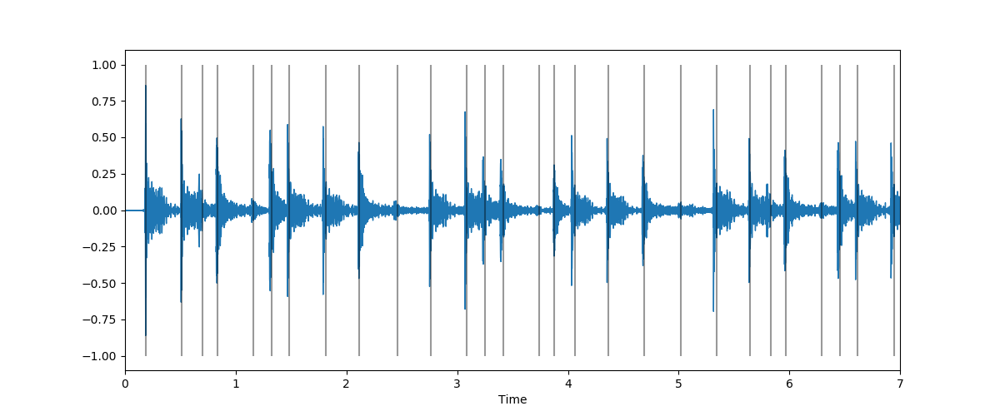

In [6]:
# Plot Onset on Top of Waveform
plt.figure(figsize=(12, 5))
librosa.display.waveplot(x, sr=fs)
plt.vlines(onset_times, -1,1, color='k', alpha=0.4);

Now we calculate the STFT of the audio data, and plot the log of its absolute value. Then we have some onset detection and plot the onsets lines on top of our graph.

X Shape (1025, 302)


<IPython.core.display.Javascript object>


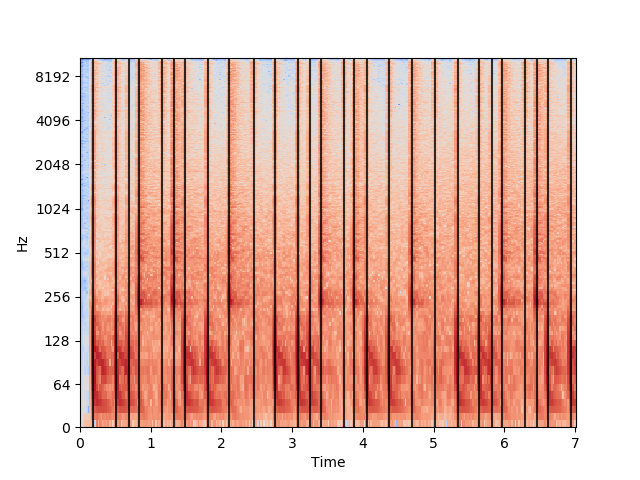

In [7]:
# STFT
S = librosa.stft(x)
X = np.absolute(S)
print("X Shape",X.shape)
import librosa.display
logS = librosa.logamplitude(S)
plt.figure()
librosa.display.specshow(logS, sr=fs, x_axis='time', y_axis='log')
plt.vlines(onset_times, 0, fs/2, color='k', alpha=0.8);

At this point we have a good idea of how our signal looks like in time and frequency. We can see two main frequency regions, a low frequency that should be the kick drum, and frequencies above 250 Hz that should be the snare drum. 

Let's move on to a NMF decomposition using 2 components.

In [8]:
# NMF Decomposition
n_components = 2
W, H = librosa.decompose.decompose(X, n_components=n_components, sort=True)
print('W shape=',W.shape)
print('H shape=',H.shape)


W shape= (1025, 2)
H shape= (2, 302)


We can visualize the W components.

<IPython.core.display.Javascript object>


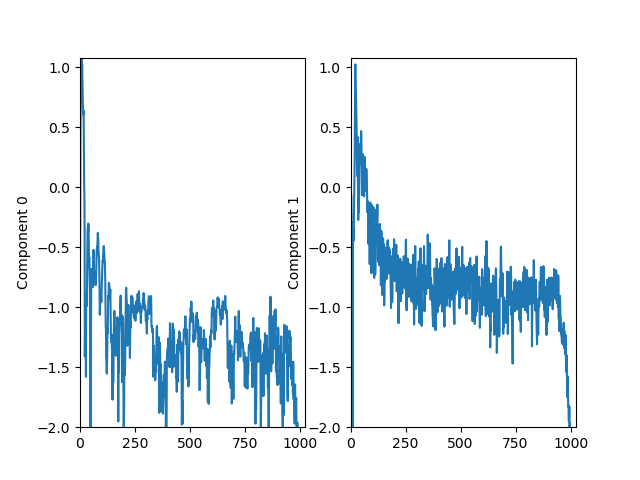

In [9]:
# Plotting W Components
plt.figure()
W[W<np.finfo(float).eps]=np.finfo(float).eps
logW = np.log10(W)
for n in range(n_components):
    plt.subplot(np.ceil(n_components/2.0), 2, n+1)
    plt.plot(logW[:,n])
    plt.ylim(-2, logW.max())
    plt.xlim(0, W.shape[0])
    plt.ylabel('Component %d' % n)

And we can also visualize the H activations.

<IPython.core.display.Javascript object>


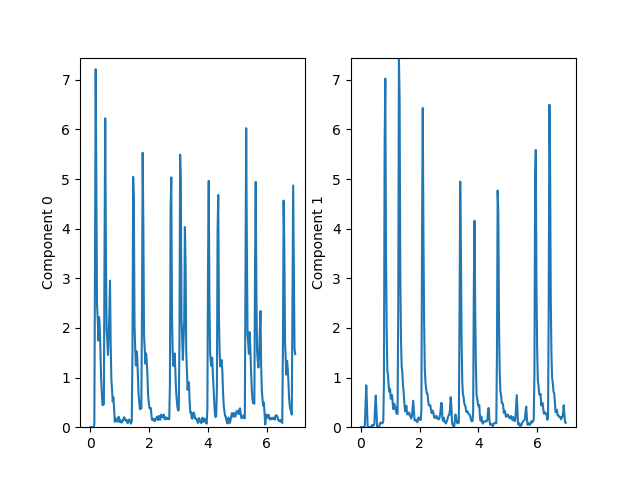

In [10]:
# Plotting H activations
plt.figure()
t=np.arange(H.shape[1])*((x.shape[0]/fs)/H.shape[1])
for n in range(n_components):
    plt.subplot(np.ceil(n_components/2.0), 2, n+1)
    plt.plot(t,H[n])
    plt.ylim(0, H.max())
    #plt.xlim(0, H.shape[1])
    plt.ylabel('Component %d' % n)

Now, we can listen to the decomposed audio signals.

In [11]:
# Playback decomposed signals
reconstructed_signal = scipy.zeros(len(x))
for n in range(n_components):
    print('Component ',n)
    Y = scipy.outer(W[:,n], H[n])*np.exp(1j*np.angle(S))
    y = librosa.istft(Y)
    reconstructed_signal[:len(y)] += y
    IPython.display.display( IPython.display.Audio(y, rate=fs) )
print("Reconstructed Signal")
IPython.display.display( IPython.display.Audio(reconstructed_signal, rate=fs) )

Component  0


Component  1


Reconstructed Signal


## We got some good intuition about NMF decomposition with the previous example.
Let's now move the another audio file. The iconic introduction of Sweet Child O' Mine by Slash, Guns n' Roses

In [12]:
# Importing audio file
filename = 'Guns N Roses-Sweet Child O Mine Intro.wav'
x, fs = librosa.load(filename)

In [13]:
# Playback audio file
IPython.display.Audio(x, rate=fs)

In [14]:
# Audio data information
print("x Shape=", x.shape)
print("Sample rate fs=", fs)
print("Audio Length in seconds=%d [s]" % (x.shape[0]/fs))

x Shape= (330750,)
Sample rate fs= 22050
Audio Lenght in seconds=15 [s]


In [15]:
# Detect Onset Frames
onset_frames = librosa.onset.onset_detect(x, sr=fs)
# Get Onset Times
onset_times = librosa.frames_to_time(onset_frames)

<IPython.core.display.Javascript object>


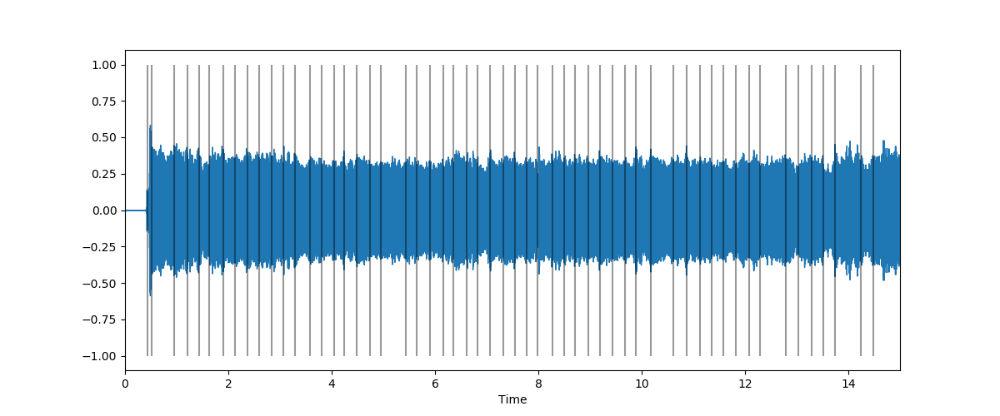

In [16]:
# Plot Onset on Top of Waveform
plt.figure(figsize=(12, 5))
librosa.display.waveplot(x, sr=fs)
plt.vlines(onset_times, -1,1, color='k', alpha=0.4);

X Shape (1025, 646)


<IPython.core.display.Javascript object>


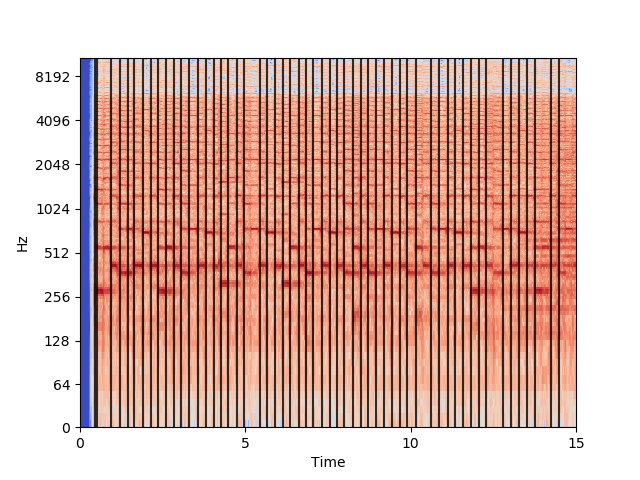

In [17]:
# STFT
S = librosa.stft(x)
X = np.absolute(S)
print("X Shape",X.shape)
import librosa.display
logS = librosa.logamplitude(S)
plt.figure()
librosa.display.specshow(logS, sr=fs, x_axis='time', y_axis='log')
plt.vlines(onset_times, 0, fs/2, color='k', alpha=0.8);

<IPython.core.display.Javascript object>


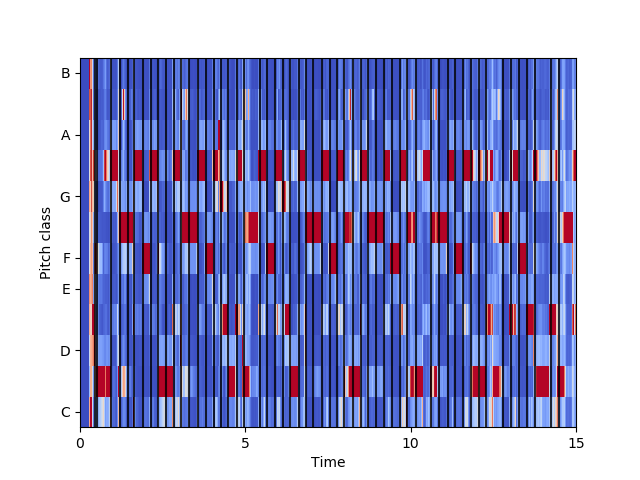

In [18]:
# Chroma
hop_length = 512
chromagram = librosa.feature.chroma_stft(x, sr=fs, hop_length=hop_length)
plt.figure()
librosa.display.specshow(chromagram, x_axis='time', y_axis='chroma', hop_length=hop_length, cmap='coolwarm')
plt.vlines(onset_times, 0, 10000, color='k', alpha=0.8);

In [19]:
# NMF Decomposition
n_components = 8
W, H = librosa.decompose.decompose(X, n_components=n_components, sort=True)
print('W shape=',W.shape)
print('H shape=',H.shape)

W shape= (1025, 8)
H shape= (8, 646)


<IPython.core.display.Javascript object>


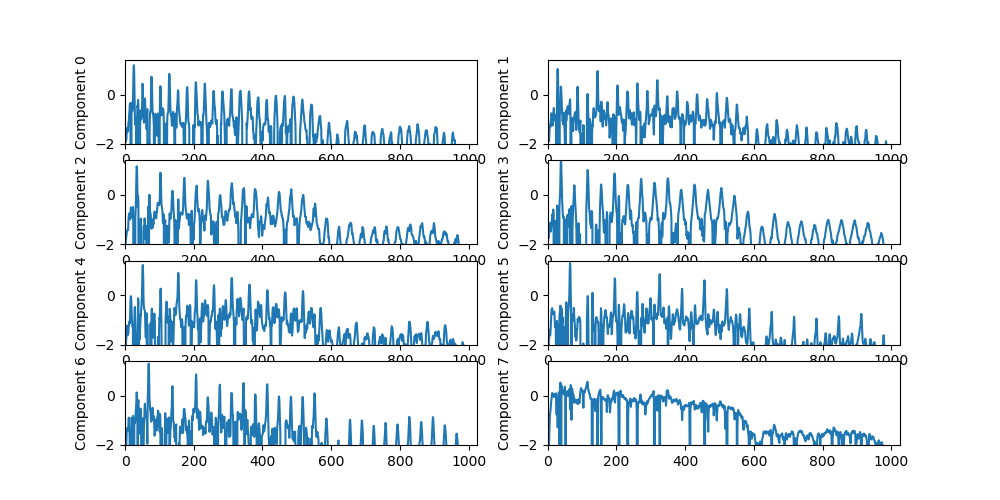

In [20]:
# Plotting W Components
plt.figure(figsize=(10, 5))
W[W<np.finfo(float).eps]=np.finfo(float).eps
logW = np.log10(W)
for n in range(n_components):
    plt.subplot(np.ceil(n_components/2.0), 2, n+1)
    plt.plot(logW[:,n])
    plt.ylim(-2, logW.max())
    plt.xlim(0, W.shape[0])
    plt.ylabel('Component %d' % n)

<IPython.core.display.Javascript object>


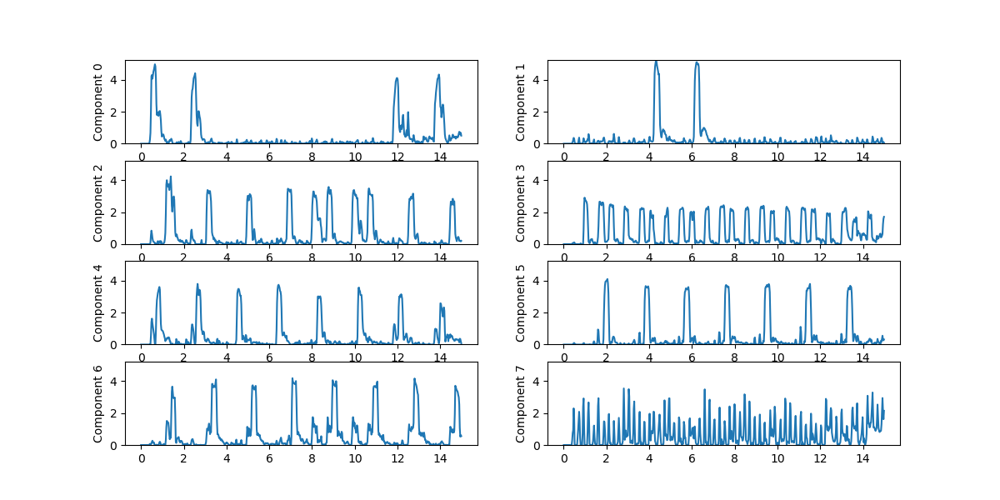

In [21]:
# Plotting H activations
plt.figure(figsize=(12, 6))
t=np.arange(H.shape[1])*((x.shape[0]/fs)/H.shape[1])
for n in range(n_components):
    plt.subplot(np.ceil(n_components/2.0), 2, n+1)
    plt.plot(t,H[n])
    plt.ylim(0, H.max())
    #plt.xlim(0, H.shape[1])
    plt.ylabel('Component %d' % n)

In [22]:
# Playback decomposed signals
reconstructed_signal = scipy.zeros(len(x))
for n in range(n_components):
    print('Component ',n)
    Y = scipy.outer(W[:,n], H[n])*np.exp(1j*np.angle(S))
    y = librosa.istft(Y)
    reconstructed_signal[:len(y)] += y
    IPython.display.display( IPython.display.Audio(y, rate=fs) )
print("Reconstructed Signal")
IPython.display.display( IPython.display.Audio(reconstructed_signal, rate=fs) )

Component  0


Component  1


Component  2


Component  3


Component  4


Component  5


Component  6


Component  7


Reconstructed Signal


# Conclusions
 Streets of Philadelphia introduction consists of a drums sequence  with a kick drum, a snare drum, a hi-hat and some background ambience. NMF component 0 consists most of the kick drum, and component 1 has most of the snare drum. 
 
 Sweet Child O' Mine introduction is a guitar riff based on the Db Major scale which consists of the pitches D♭, E♭, F, G♭, A♭, B♭ and C. 
 In this particcular piece B♭ and C are not played <br>
 The NMF decomposition resulted in the following components: <br>
- Component 0. $	\rightarrow$  D♭ 
- Component 1.  $	\rightarrow$ E♭
- Component 2.  $	\rightarrow$ G♭
- Component 3.  $	\rightarrow$ A♭
- Component 4.  $	\rightarrow$ D♭ (one octave higher than Component 0)
- Component 5.  $	\rightarrow$ F 
- Component 6.  $	\rightarrow$ G♭ (one octave higher than Component 2)
- Component 7.  $	\rightarrow$ Can be interpreted perhaps as the percusive component os all notes.
The decomposition is pretty much in good correspondance with what we saw from  the chroma plot.

